In [1]:
# imports

import codecs
import json
import configparser
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model

%matplotlib inline

**There's one path in the following cell that you need to adapt, unfortunately.**

In [2]:
# Load up config file (needs path; adapt env var if necessary); local imports

# load config file, set up paths, make project-specific imports
config_path = os.environ.get('VISCONF')
if not config_path:
    # try default location, if not in environment
    default_path_to_config = '../Config/default.cfg'
    if os.path.isfile(default_path_to_config):
        config_path = default_path_to_config

assert config_path is not None, 'You need to specify the path to the config file via environment variable VISCONF.'        

config = configparser.ConfigParser()
with codecs.open(config_path, 'r', encoding='utf-8') as f:
    config.read_file(f)

corpora_base = config.get('DEFAULT', 'corpora_base')
preproc_path = config.get('DSGV-PATHS', 'preproc_path')
dsgv_home = config.get('DSGV-PATHS', 'dsgv_home')


sys.path.append(dsgv_home + '/Utils')
from utils import icorpus_code, plot_labelled_bb, get_image_filename, query_by_id
from utils import plot_img_cropped, plot_img_ax, invert_dict, get_a_by_b, get_image_part
sys.path.append(dsgv_home + '/WACs/WAC_Utils')
from wac_utils import create_word2den, is_relational, filter_refdf_by_filelist, filter_relational_expr
from wac_utils import filter_X_by_filelist, make_mask_matrix, make_X_id_index, train_this_word
from wac_utils import get_X_for_word
sys.path.append(dsgv_home + '/Preproc')

# Path needs to be adapted, unfortunately...
sys.path.append('/Users/das/work/svn/Gits/p_Public/sempix/Common')
from data_utils import load_dfs

In [3]:
from importlib import reload
import wac_utils
reload(wac_utils)

<module 'wac_utils' from '/Users/das/work/svn/Gits/p_Public/clp-vision/WACs/WAC_Utils/wac_utils.py'>

In [4]:
# Load up preprocessed DataFrames. Slow!
# These DataFrames are the result of pre-processing the original corpus data,
# as per dsg-vision/Preprocessing/preproc.py

df_names = ['saiapr_bbdf', 'saiapr_refdf',
            'mscoco_bbdf', 'refcoco_refdf', 'refcocoplus_refdf']
df = load_dfs(preproc_path, df_names)

In [5]:
def get_patch_from_triple(row, resize=True, xs=224, ys=224):
    # get_image_part() return tuple, we only need the image patch
    out = get_image_part(config, (None, None),
                          row['i_corpus'], row['image_id'], row['bb'], resize=resize, xs=xs, ys=ys)[1]
    return out

In [6]:
def get_all_objects(df, name):
    return df[df['name'] == name]['i_corpus image_id bb'.split()]

In [7]:
def plot_grid(img_list, n_cols=10, figsize=(15, 15)):
    n = len(img_list)
    n_rows = n // n_cols + (1 if n % n_cols else 0)

    fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    fig.subplots_adjust(hspace=0, wspace=0)

    for n, img in enumerate(img_list):
        this_ax = ax[n // n_cols, n % n_cols]
        this_ax.imshow(img)
        this_ax.axis('off')

In [8]:
def sample_n_get_patch(df, name, n=100):
    out = []
    # Interesting. Turns out that somewhere along the line, .apply() changed
    #  its semantics, and became really slow for this use case. Slower even
    #  than iterrows()..
    for i, row in get_all_objects(df, name).sample(n).iterrows():
        out.append(get_patch_from_triple(row))
    return out

In [9]:
def plot_ref_word(df, w2d, word, n=100):
    mcols = 'i_corpus image_id region_id'.split()
    tmpdf = pd.DataFrame(w2d[word], columns=mcols)
    n = min(n, len(tmpdf))
    out = []
    for m, row in pd.merge(df, tmpdf, how='inner', on=mcols).sample(n).iterrows():
        out.append(get_patch_from_triple(row))
    plot_grid(out)

In [10]:
with open(preproc_path + '/refcoco_splits.json', 'r') as f:
    rc_splits = json.load(f)

In [11]:
rc_splits.keys()

dict_keys(['testA', 'train', 'val', 'testB'])

In [12]:
refdf_train = filter_refdf_by_filelist(df['refcoco_refdf'], rc_splits['train'])
refdf_train = filter_relational_expr(refdf_train)

In [13]:
word2den = create_word2den(refdf_train)

In [14]:
word2den['bicycle'][:10]

[(1, 494534, 1767902),
 (1, 59947, 127230),
 (1, 431872, 418229),
 (1, 194643, 130531),
 (1, 196676, 1764990),
 (1, 321185, 131658),
 (1, 242457, 125685),
 (1, 199594, 125540),
 (1, 490888, 129114),
 (1, 34815, 126702)]

In [15]:
len(word2den['bicycle'])

33

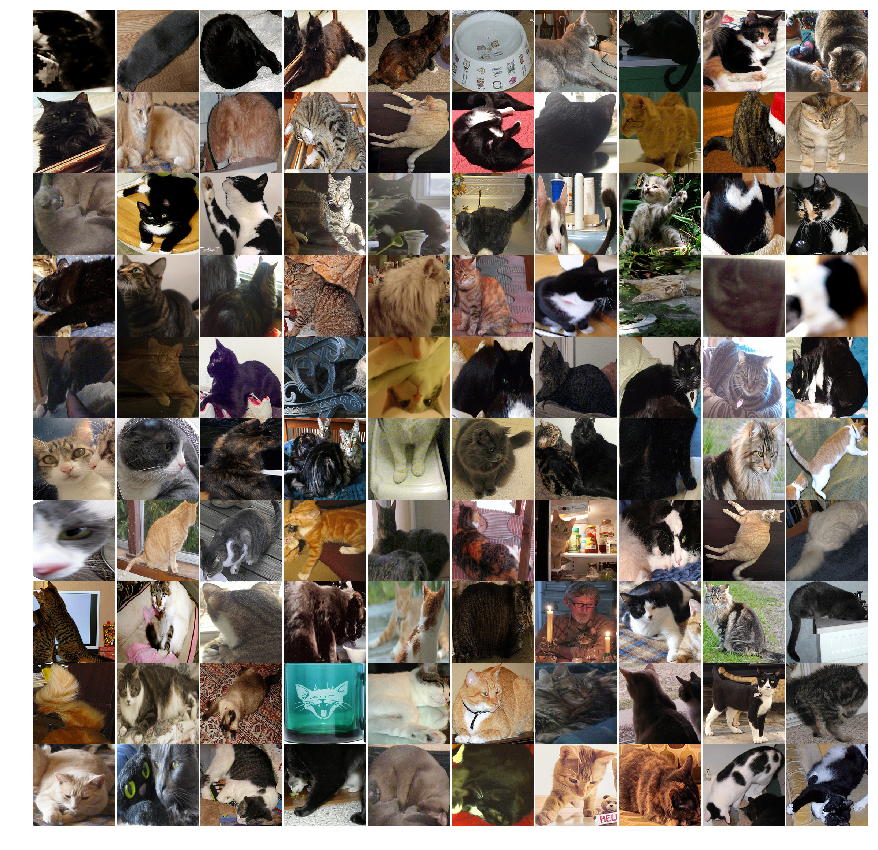

In [16]:
plot_ref_word(df['mscoco_bbdf'], word2den, 'cat')

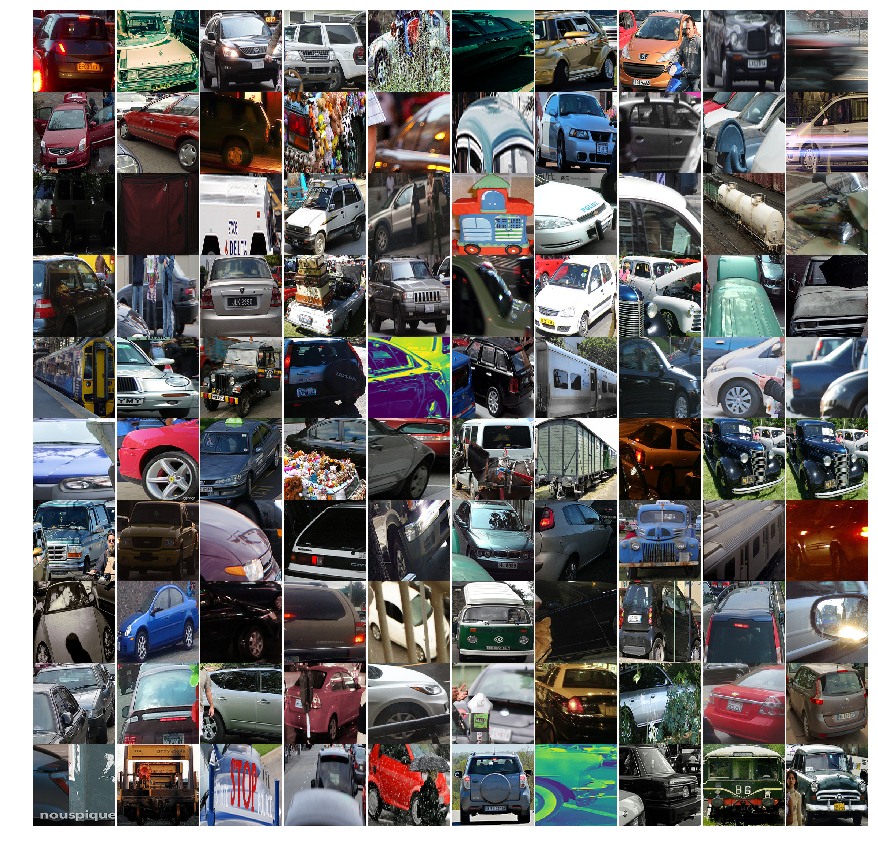

In [17]:
plot_ref_word(df['mscoco_bbdf'], word2den, 'car')

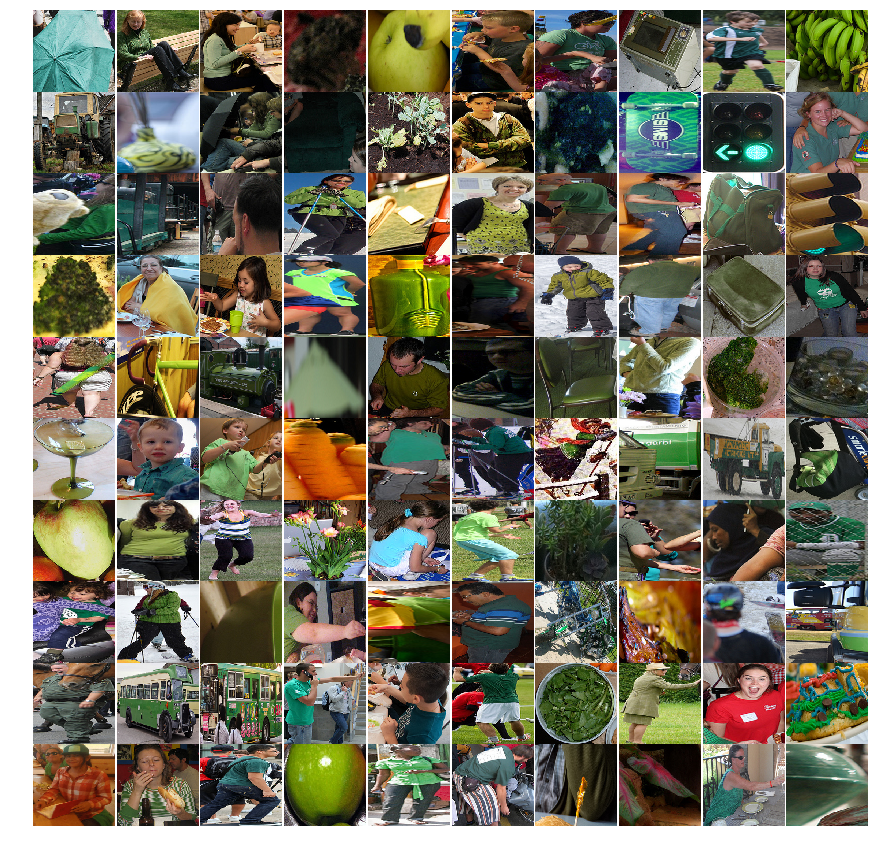

In [18]:
plot_ref_word(df['mscoco_bbdf'], word2den, 'green')

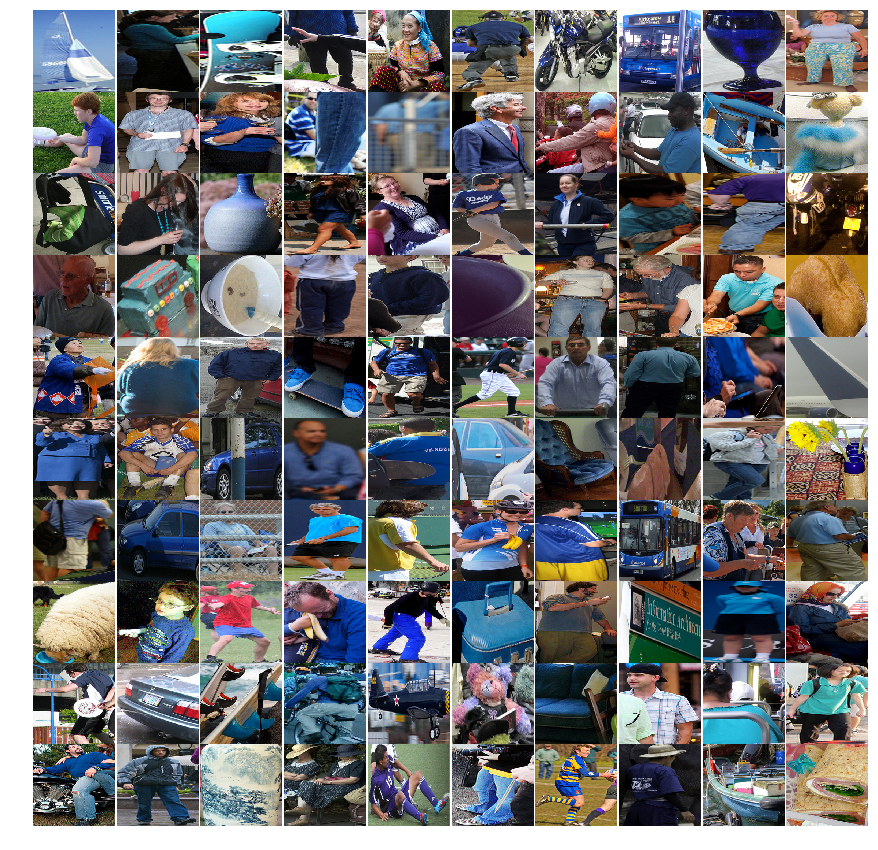

In [19]:
plot_ref_word(df['mscoco_bbdf'], word2den, 'blue')

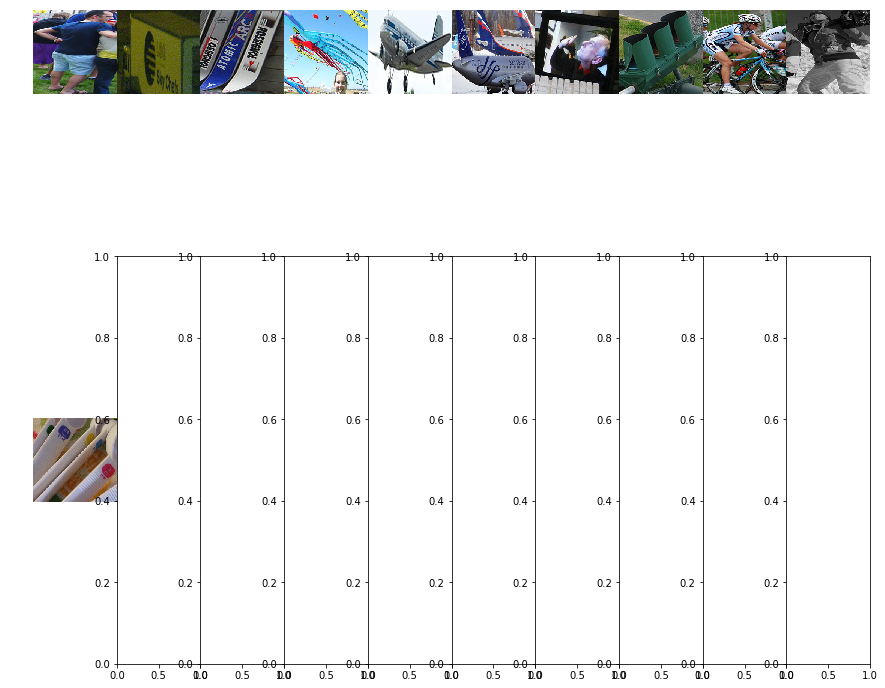

In [20]:
plot_ref_word(df['mscoco_bbdf'], word2den, 'sky')

In [21]:
word2den_saiapr = create_word2den(df['saiapr_refdf'])

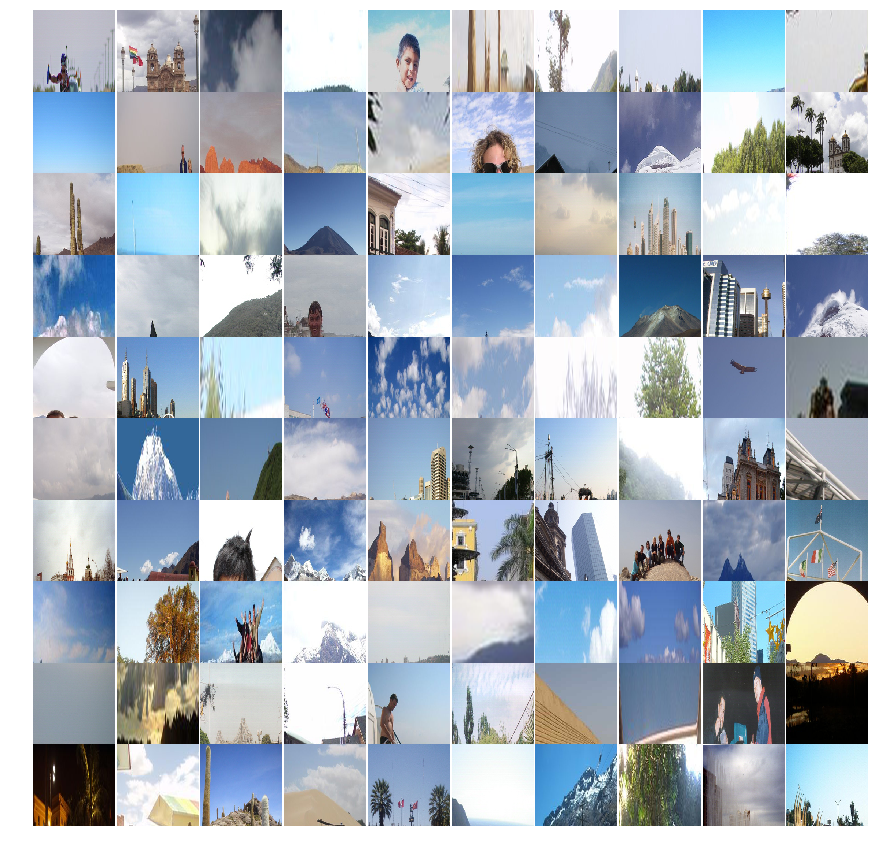

In [23]:
plot_ref_word(df['saiapr_bbdf'], word2den_saiapr, 'sky')

In [24]:
config.get('DSGV-PATHS', 'extract_out_dir')

'/Users/das/work/Models/clp-vision/ExtractOut'

In [25]:
X = np.load(config.get('DSGV-PATHS', 'extract_out_dir') + '/mscoco_bbdf_vgg19-fc2.npz')['arr_0']

In [26]:
X.nbytes / 1024 / 1024 / 1024

5.999658316373825

In [27]:
X.shape

(196118, 4106)

In [28]:
X[:3,:3]

array([[1.00000e+00, 4.80023e+05, 8.60000e+01],
       [1.00000e+00, 4.80023e+05, 4.38029e+05],
       [1.00000e+00, 4.80023e+05, 4.60329e+05]])

In [29]:
X[:3, -7:]

array([[0.24364583, 0.47790625, 0.83802083, 0.89357813, 0.24706497,
        0.75      , 0.30119995],
       [0.15672917, 0.21046875, 0.58      , 0.54739063, 0.1426092 ,
        0.75      , 0.24995336],
       [0.49860417, 0.27653125, 0.7289375 , 0.485375  , 0.04810368,
        0.75      , 0.23434974]])

In [30]:
X_t = filter_X_by_filelist(X, rc_splits['train'])

In [31]:
X_idx = make_X_id_index(X_t)
mask_matrix = make_mask_matrix(X_t, X_idx, word2den, word2den.keys())

In [32]:
list(X_idx.keys())[:10]

[(1, 480023, 86),
 (1, 480023, 438029),
 (1, 480023, 460329),
 (1, 480023, 498741),
 (1, 480023, 1200708),
 (1, 480023, 1269658),
 (1, 480023, 1292891),
 (1, 480023, 1293860),
 (1, 480023, 1742280),
 (1, 480023, 1745965)]

In [33]:
mask_matrix.shape

(8787, 166354)

In [34]:
X_t.shape

(166354, 4106)

In [35]:
mask_matrix[0]

array([False, False, False, ...,  True, False,  True])

In [36]:
min_freq = 40
counts = mask_matrix.sum(axis=1)
wordlist = np.array(list(word2den.keys()))[counts > min_freq]

In [37]:
wordlist[:10]

array(['the', 'lady', 'with', 'blue', 'shirt', 'back', 'to', 'us',
       'woman', 'in'], dtype='<U19')

In [38]:
df['refcoco_refdf'].iloc[0]

i_corpus                                                     1
image_id                                                581857
region_id                                              1719310
r_corpus                                               refcoco
rex_id                                                       0
refexp                            the lady with the blue shirt
tagged       [[the, DT], [lady, NN], [with, IN], [the, DT],...
Name: 0, dtype: object

In [39]:
wordsample = np.random.choice(wordlist, 20)

In [40]:
wordsample

array(['shorts', 'female', 'ground', 'surfboard', 'motorcycle', 'eating',
       'chocolate', 'jar', 'rear', 'large', 'plant', 'clothes', 'long',
       'to', 'adult', 'forward', 'pic', 'box', 'lady', 'dot'],
      dtype='<U19')

In [41]:
classifier = linear_model.LogisticRegression
classf_params = {'penalty': 'l1', 'warm_start': True, 'solver': 'liblinear'}

In [42]:
nneg = 20000
wacs = [train_this_word(X_t, word2den, mask_matrix, nneg, classifier, classf_params, this_word)
       for this_word in wordsample]

....................

In [43]:
wacs[:2]

[('shorts',
  310,
  20310,
  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
            intercept_scaling=1, max_iter=100, multi_class='warn',
            n_jobs=None, penalty='l1', random_state=None, solver='liblinear',
            tol=0.0001, verbose=0, warm_start=True)),
 ('female',
  88,
  20088,
  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
            intercept_scaling=1, max_iter=100, multi_class='warn',
            n_jobs=None, penalty='l1', random_state=None, solver='liblinear',
            tol=0.0001, verbose=0, warm_start=True))]

In [44]:
for this_word, npos, _, this_clsf in wacs:
    print(this_word, npos, '\t', end='')
    X_tst, y_tst = get_X_for_word(X_t, word2den, mask_matrix, this_word, neg_max='balanced')
    print(this_clsf.score(X_tst, y_tst))

shorts 310 	1.0
female 88 	1.0
ground 93 	1.0
surfboard 87 	1.0
motorcycle 325 	1.0
eating 166 	0.9939759036144579
chocolate 108 	1.0
jar 60 	1.0
rear 105 	0.9952380952380953
large 174 	1.0
plant 101 	1.0
clothes 65 	1.0
long 141 	0.9964539007092199
to 2305 	0.8255965292841648
adult 145 	1.0
forward 44 	1.0
pic 405 	0.9962962962962963
box 143 	1.0
lady 1722 	0.977061556329849
dot 42 	1.0


In [45]:
rc_all_test = rc_splits['val']  # rc_splits['testA'] + rc_splits['testB']
X_ts = filter_X_by_filelist(X, rc_all_test)
refdf_test = filter_refdf_by_filelist(df['refcoco_refdf'], rc_all_test)

In [46]:
word2den_ts = create_word2den(refdf_test)
X_idx_ts = make_X_id_index(X_ts)
mask_matrix_ts = make_mask_matrix(X_ts, X_idx_ts, word2den_ts, word2den_ts.keys())

In [48]:
for this_word, npos, _, this_clsf in wacs:
    print(this_word, npos, '\t', end='')
    try:
        X_tst, y_tst = get_X_for_word(X_ts, word2den_ts, mask_matrix_ts, this_word, neg_max='balanced')
    except:
        continue
    print(this_clsf.score(X_tst, y_tst))

shorts 310 	0.6551724137931034
female 88 	0.5
ground 93 	0.5
surfboard 87 	0.5
motorcycle 325 	0.8333333333333334
eating 166 	0.6333333333333333
chocolate 108 	0.7692307692307693
jar 60 	Error!! No mask available for this word! (jar)
rear 105 	0.5
large 174 	0.53125
plant 101 	0.75
clothes 65 	0.5
long 141 	0.5
to 2305 	0.5797101449275363
adult 145 	0.5
forward 44 	0.5
pic 405 	0.5294117647058824
box 143 	0.53125
lady 1722 	0.6568047337278107
dot 42 	0.5


### Tasks

1. Play around with this notebook. Try to understand what each cell is doing.

Pick one of the following:

- Try to improve the results. For example, you could try the multi-layer perceptron in scikit learn, and see if this improves results. (And then you could see how the hyperparameters influence results, like how many layers you use.)  Or be adventurous and run a network built in PyTorch for example over it.
- Relatedly, you could try to set this up as a multiclass learning problem. But how would you group classes together? The whole vocabulary? Or paradigms built in some other way? (Like one classifiers for all colours?) How would you compare results to the binary setup?
- Advanced: Artificially create images (and feed them through the extractor in `extract.py`, or something like it) and test classifiers trained in the way described above on them. For example, you could create images with uniform colours, one for each different shade of colour, and then run them on the classifier for "green". Which images does this classifier like most? You could then create a plot that relates colour value to response.  
    Or you could do this for bounding boxes of different size and / or different locations in the image filled with random colour values (so that there is no shape information), and in this way test what influence the positional features (see `extract.py` for how the positional features are computed) have for example for the word "small", or the word "top".